In [1]:
import pandas as pd, numpy as np
import numpy as np
from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler,Normalizer
import matplotlib.pyplot as plt

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
file_paths="/kaggle/input/yield-curve-kirk/data_ann (2).csv"

In [3]:
df=pd.read_csv(file_paths)
df.columns = df.columns.str.replace(' ', '')
df.set_index("Date",inplace=True)
#df = df.loc[:,df.columns != "Date"]
df.interpolate(method ='linear', limit_direction ='both',inplace=True)

In [4]:
# develop the linear regression model and outputs
def linear_reg_model(feature_of_Interest):
    '''
    Input: the feature that we are interested in
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
    
    '''
    from sklearn.preprocessing import StandardScaler,Normalizer

    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)

    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)

    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)

    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    from sklearn.linear_model import LinearRegression

    # Assuming X_train and y_train represent your original features and target
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_train_normalized, y_train)

    # Use the trained model to predict new values based on X_train
    synthetic_data = model.predict(X_train_normalized)

    # Now y_train_combined contains the original target data along with synthetic data

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    mse_values=(predictions - y_test_forecast)**2
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

In [5]:
#nn relfeat_non_normalized
def NN_RelFeat_non_normalized(feature_of_Interest):

    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized.iloc[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=800, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

In [6]:
#nn relfeat
def NN_RelFeat(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    
    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]
    
    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

In [7]:
#nn TgtOnly
def NN_TgtOnly(feature_of_Interest):

    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''

    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]


    X_train, X_test, y_train, y_test = train_test_split(y[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are your feature sets
    scaler = StandardScaler()
    

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    #y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    #std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    #mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    #std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a


In [8]:
#NN RelFeat+LRdata
def RealFeat_LRdata(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]

    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)

    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train1 = scaler.fit_transform(X_train)
    X_test1 = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized1 = X_train1
    X_test_normalized1 = X_test1

    ###################################################################################
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)

    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)
    # Use the trained model to predict new values based on X_train
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2
    #####################################################################################

    # Normalize train and test sets
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))

    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }

    return a
    

In [9]:
#nn TgtOnly + LRdata
def NN_TgtOnly_LRdata(feature_of_Interest):
    
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]

    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are feature sets

    #selected_features = pd.DataFrame(index=X_train.columns)
    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train1 = scaler.fit_transform(X_train)
    X_test1 = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized1 = X_train1
    X_test_normalized1 = X_test1

    ###################################################################################
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)

    # Use the trained model to predict new values based on X_train
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)

    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2

    X_train[feature_of_Interest]=y_train
    X_test[feature_of_Interest]=y_test

    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

In [10]:
horizons=[1,6,11,16,21]
yields=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse=[]
fig_5={}
table4_data=[]
for i in horizons:
    by_maturity=[]
    for j in yields:
        #print(j+str(i))
        target_=j+str(i)
        a=linear_reg_model(target_)
        b=NN_RelFeat(target_)
        c=NN_TgtOnly(target_)
        d=RealFeat_LRdata(target_)
        e=NN_TgtOnly_LRdata(target_)
        if (i==1 and target_=='GECU10YR_lag_1'):#list_mse1[0][3][1]
            fig_5.update({'Actual_Yield':b['Actual_Yield'],'Predicted_Yield':b['Predicted_Yield'],'GECU10YR_lag_1':b})
            #fig_5.append([b['Actual_Yield'],b['Predicted_Yield']])
        by_maturity.append([a['mse_values'],b['mse_values'],c['mse_values'],d['mse_values'],e['mse_values']])
    list_mse.append(by_maturity)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.913e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.913e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 2s 10ms/step - loss: 7.3333 - mae: 2.3889 - mse: 7.3333 - root_mean_squared_error: 2.7080 - val_loss: 4.1702 - val_mae: 1.8143 - val_mse: 4.1702 - val_root_mean_squared_error: 2.0421
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.8341 - mae: 1.6708 - mse: 3.8341 - root_mean_squared_error: 1.9581 - val_loss: 1.7195 - val_mae: 1.1220 - val_mse: 1.7195 - val_root_mean_squared_error: 1.3113
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.3680 - mae: 0.9049 - mse: 1.3680 - root_mean_squared_error: 1.1696 - val_loss: 0.5014 - val_mae: 0.4829 - val_mse: 0.5014 - val_root_mean_squared_error: 0.7081
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6784 - mae: 0.5649 - mse: 0.6784 - root_mean_squared_error: 0.8237 - val_loss: 0.2986 - val_mae: 0.3246 - val_mse: 0.2986 - val_root_mean_squared_error: 0.5464
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.775e+00, tolerance: 3.933e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.0028 - mae: 2.0938 - mse: 6.0028 - root_mean_squared_error: 2.4501 - val_loss: 3.8067 - val_mae: 1.6300 - val_mse: 3.8067 - val_root_mean_squared_error: 1.9511
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.5626 - mae: 1.2529 - mse: 2.5626 - root_mean_squared_error: 1.6008 - val_loss: 1.6897 - val_mae: 0.9732 - val_mse: 1.6897 - val_root_mean_squared_error: 1.2999
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0958 - mae: 0.7448 - mse: 1.0958 - root_mean_squared_error: 1.0468 - val_loss: 0.9085 - val_mae: 0.6355 - val_mse: 0.9085 - val_root_mean_squared_error: 0.9531
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6906 - mae: 0.5715 - mse: 0.6906 - root_mean_squared_error: 0.8310 - val_loss: 0.6821 - val_mae: 0.5205 - val_mse: 0.6821 - val_root_mean_squared_error: 0.8259
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.432e+00, tolerance: 4.009e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 2s 8ms/step - loss: 7.0526 - mae: 2.3043 - mse: 7.0526 - root_mean_squared_error: 2.6557 - val_loss: 4.2954 - val_mae: 1.7722 - val_mse: 4.2954 - val_root_mean_squared_error: 2.0725
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.6357 - mae: 1.3600 - mse: 2.6357 - root_mean_squared_error: 1.6235 - val_loss: 0.9011 - val_mae: 0.7553 - val_mse: 0.9011 - val_root_mean_squared_error: 0.9493
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6081 - mae: 0.5920 - mse: 0.6081 - root_mean_squared_error: 0.7798 - val_loss: 0.4068 - val_mae: 0.4701 - val_mse: 0.4068 - val_root_mean_squared_error: 0.6378
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3432 - mae: 0.4456 - mse: 0.3432 - root_mean_squared_error: 0.5859 - val_loss: 0.3000 - val_mae: 0.4069 - val_mse: 0.3000 - val_root_mean_squared_error: 0.5478
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.594e-01, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.594e-01, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.8637 - mae: 2.3377 - mse: 6.8637 - root_mean_squared_error: 2.6199 - val_loss: 4.1748 - val_mae: 1.7882 - val_mse: 4.1748 - val_root_mean_squared_error: 2.0432
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.0670 - mae: 1.4741 - mse: 3.0670 - root_mean_squared_error: 1.7513 - val_loss: 1.2118 - val_mae: 0.8536 - val_mse: 1.2118 - val_root_mean_squared_error: 1.1008
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9132 - mae: 0.7059 - mse: 0.9132 - root_mean_squared_error: 0.9556 - val_loss: 0.4865 - val_mae: 0.5427 - val_mse: 0.4865 - val_root_mean_squared_error: 0.6975
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5263 - mae: 0.5431 - mse: 0.5263 - root_mean_squared_error: 0.7255 - val_loss: 0.4424 - val_mae: 0.5334 - val_mse: 0.4424 - val_root_mean_squared_error: 0.6651
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.417e+00, tolerance: 3.313e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.9344 - mae: 2.5310 - mse: 7.9344 - root_mean_squared_error: 2.8168 - val_loss: 6.2023 - val_mae: 2.1875 - val_mse: 6.2023 - val_root_mean_squared_error: 2.4904
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.9696 - mae: 1.7348 - mse: 3.9696 - root_mean_squared_error: 1.9924 - val_loss: 2.5391 - val_mae: 1.3295 - val_mse: 2.5391 - val_root_mean_squared_error: 1.5935
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2987 - mae: 0.9093 - mse: 1.2987 - root_mean_squared_error: 1.1396 - val_loss: 0.9166 - val_mae: 0.6717 - val_mse: 0.9166 - val_root_mean_squared_error: 0.9574
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5126 - mae: 0.5117 - mse: 0.5126 - root_mean_squared_error: 0.7160 - val_loss: 0.5483 - val_mae: 0.5128 - val_mse: 0.5483 - val_root_mean_squared_error: 0.7405
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.481e-01, tolerance: 3.242e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 5.3054 - mae: 2.1170 - mse: 5.3054 - root_mean_squared_error: 2.3033 - val_loss: 4.4275 - val_mae: 1.7770 - val_mse: 4.4275 - val_root_mean_squared_error: 2.1042
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.2815 - mae: 1.2826 - mse: 2.2815 - root_mean_squared_error: 1.5105 - val_loss: 2.2241 - val_mae: 1.1670 - val_mse: 2.2241 - val_root_mean_squared_error: 1.4913
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9488 - mae: 0.7660 - mse: 0.9488 - root_mean_squared_error: 0.9741 - val_loss: 1.4841 - val_mae: 0.9260 - val_mse: 1.4841 - val_root_mean_squared_error: 1.2182
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6143 - mae: 0.5978 - mse: 0.6143 - root_mean_squared_error: 0.7838 - val_loss: 1.1118 - val_mae: 0.7552 - val_mse: 1.1118 - val_root_mean_squared_error: 1.0544
Epoch 5/500
33/33 [==============================] - 0s 5ms/step - loss:

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.6693 - mae: 2.6214 - mse: 7.6693 - root_mean_squared_error: 2.7693 - val_loss: 5.4135 - val_mae: 2.1459 - val_mse: 5.4135 - val_root_mean_squared_error: 2.3267
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.4094 - mae: 1.6232 - mse: 3.4094 - root_mean_squared_error: 1.8465 - val_loss: 2.1913 - val_mae: 1.2251 - val_mse: 2.1913 - val_root_mean_squared_error: 1.4803
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.4552 - mae: 1.0036 - mse: 1.4552 - root_mean_squared_error: 1.2063 - val_loss: 1.2644 - val_mae: 0.9287 - val_mse: 1.2644 - val_root_mean_squared_error: 1.1245
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9594 - mae: 0.7842 - mse: 0.9594 - root_mean_squared_error: 0.9795 - val_loss: 0.9114 - val_mae: 0.7875 - val_mse: 0.9114 - val_root_mean_squared_error: 0.9547
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.6708 - mae: 2.6194 - mse: 7.6708 - root_mean_squared_error: 2.7696 - val_loss: 5.3597 - val_mae: 2.1166 - val_mse: 5.3597 - val_root_mean_squared_error: 2.3151
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.9585 - mae: 1.7854 - mse: 3.9585 - root_mean_squared_error: 1.9896 - val_loss: 2.5486 - val_mae: 1.3529 - val_mse: 2.5486 - val_root_mean_squared_error: 1.5964
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0663 - mae: 1.2230 - mse: 2.0663 - root_mean_squared_error: 1.4375 - val_loss: 1.3931 - val_mae: 0.9928 - val_mse: 1.3931 - val_root_mean_squared_error: 1.1803
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.3420 - mae: 0.9703 - mse: 1.3420 - root_mean_squared_error: 1.1584 - val_loss: 0.9195 - val_mae: 0.7820 - val_mse: 0.9195 - val_root_mean_squared_error: 0.9589
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 11.1448 - mae: 3.2310 - mse: 11.1448 - root_mean_squared_error: 3.3384 - val_loss: 9.0441 - val_mae: 2.8630 - val_mse: 9.0441 - val_root_mean_squared_error: 3.0073
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 6.3091 - mae: 2.3186 - mse: 6.3091 - root_mean_squared_error: 2.5118 - val_loss: 4.8673 - val_mae: 1.9783 - val_mse: 4.8673 - val_root_mean_squared_error: 2.2062
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.1734 - mae: 1.5269 - mse: 3.1734 - root_mean_squared_error: 1.7814 - val_loss: 2.5011 - val_mae: 1.3756 - val_mse: 2.5011 - val_root_mean_squared_error: 1.5815
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.9183 - mae: 1.1738 - mse: 1.9183 - root_mean_squared_error: 1.3850 - val_loss: 1.5792 - val_mae: 1.0738 - val_mse: 1.5792 - val_root_mean_squared_error: 1.2567
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.101e-01, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 10.5381 - mae: 3.1526 - mse: 10.5381 - root_mean_squared_error: 3.2462 - val_loss: 7.1319 - val_mae: 2.5612 - val_mse: 7.1319 - val_root_mean_squared_error: 2.6706
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 5.2878 - mae: 2.0950 - mse: 5.2878 - root_mean_squared_error: 2.2995 - val_loss: 2.8828 - val_mae: 1.5033 - val_mse: 2.8828 - val_root_mean_squared_error: 1.6979
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.4631 - mae: 1.3614 - mse: 2.4631 - root_mean_squared_error: 1.5694 - val_loss: 1.5280 - val_mae: 1.0845 - val_mse: 1.5280 - val_root_mean_squared_error: 1.2361
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.7287 - mae: 1.1198 - mse: 1.7287 - root_mean_squared_error: 1.3148 - val_loss: 1.1402 - val_mae: 0.9148 - val_mse: 1.1402 - val_root_mean_squared_error: 1.0678
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - los

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.5566 - mae: 3.1523 - mse: 10.5566 - root_mean_squared_error: 3.2491 - val_loss: 6.6078 - val_mae: 2.4383 - val_mse: 6.6078 - val_root_mean_squared_error: 2.5706
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 5.2636 - mae: 2.1003 - mse: 5.2636 - root_mean_squared_error: 2.2943 - val_loss: 2.4039 - val_mae: 1.2699 - val_mse: 2.4039 - val_root_mean_squared_error: 1.5504
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.1852 - mae: 1.2259 - mse: 2.1852 - root_mean_squared_error: 1.4782 - val_loss: 1.1357 - val_mae: 0.9239 - val_mse: 1.1357 - val_root_mean_squared_error: 1.0657
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.4161 - mae: 0.9419 - mse: 1.4161 - root_mean_squared_error: 1.1900 - val_loss: 0.8613 - val_mae: 0.8015 - val_mse: 0.8613 - val_root_mean_squared_error: 0.9281
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.038e-01, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.038e-01, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 14.3487 - mae: 3.6533 - mse: 14.3487 - root_mean_squared_error: 3.7880 - val_loss: 11.9044 - val_mae: 3.3062 - val_mse: 11.9044 - val_root_mean_squared_error: 3.4503
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 8.4259 - mae: 2.6525 - mse: 8.4259 - root_mean_squared_error: 2.9027 - val_loss: 6.5701 - val_mae: 2.3690 - val_mse: 6.5701 - val_root_mean_squared_error: 2.5632
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.7608 - mae: 1.8871 - mse: 4.7608 - root_mean_squared_error: 2.1819 - val_loss: 3.7757 - val_mae: 1.7632 - val_mse: 3.7757 - val_root_mean_squared_error: 1.9431
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2381 - mae: 1.5452 - mse: 3.2381 - root_mean_squared_error: 1.7995 - val_loss: 2.4481 - val_mae: 1.3927 - val_mse: 2.4481 - val_root_mean_squared_error: 1.5646
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - l

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.822e-01, tolerance: 1.161e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 14.9318 - mae: 3.7633 - mse: 14.9318 - root_mean_squared_error: 3.8642 - val_loss: 10.4147 - val_mae: 3.0948 - val_mse: 10.4147 - val_root_mean_squared_error: 3.2272
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 8.7659 - mae: 2.7399 - mse: 8.7659 - root_mean_squared_error: 2.9607 - val_loss: 6.0027 - val_mae: 2.0919 - val_mse: 6.0027 - val_root_mean_squared_error: 2.4500
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 5.0027 - mae: 1.8907 - mse: 5.0027 - root_mean_squared_error: 2.2367 - val_loss: 3.8506 - val_mae: 1.6129 - val_mse: 3.8506 - val_root_mean_squared_error: 1.9623
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.1703 - mae: 1.4969 - mse: 3.1703 - root_mean_squared_error: 1.7805 - val_loss: 2.5278 - val_mae: 1.2396 - val_mse: 2.5278 - val_root_mean_squared_error: 1.5899
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.929e-01, tolerance: 1.163e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 16.8013 - mae: 3.9615 - mse: 16.8013 - root_mean_squared_error: 4.0989 - val_loss: 12.2294 - val_mae: 3.3092 - val_mse: 12.2294 - val_root_mean_squared_error: 3.4971
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 9.7519 - mae: 2.8243 - mse: 9.7519 - root_mean_squared_error: 3.1228 - val_loss: 5.6080 - val_mae: 1.9923 - val_mse: 5.6080 - val_root_mean_squared_error: 2.3681
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.6397 - mae: 1.7943 - mse: 4.6397 - root_mean_squared_error: 2.1540 - val_loss: 3.4930 - val_mae: 1.5157 - val_mse: 3.4930 - val_root_mean_squared_error: 1.8690
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.8371 - mae: 1.3940 - mse: 2.8371 - root_mean_squared_error: 1.6844 - val_loss: 2.7855 - val_mae: 1.3448 - val_mse: 2.7855 - val_root_mean_squared_error: 1.6690
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.241e+00, tolerance: 3.962e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.241e+00, tolerance: 3.962e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.3819 - mae: 2.2135 - mse: 6.3819 - root_mean_squared_error: 2.5262 - val_loss: 3.7992 - val_mae: 1.7038 - val_mse: 3.7992 - val_root_mean_squared_error: 1.9491
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.0857 - mae: 1.4694 - mse: 3.0857 - root_mean_squared_error: 1.7566 - val_loss: 1.3556 - val_mae: 0.9597 - val_mse: 1.3556 - val_root_mean_squared_error: 1.1643
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0798 - mae: 0.7708 - mse: 1.0798 - root_mean_squared_error: 1.0392 - val_loss: 0.5433 - val_mae: 0.4949 - val_mse: 0.5433 - val_root_mean_squared_error: 0.7371
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6680 - mae: 0.5942 - mse: 0.6680 - root_mean_squared_error: 0.8173 - val_loss: 0.4401 - val_mae: 0.4283 - val_mse: 0.4401 - val_root_mean_squared_error: 0.6634
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.431e+00, tolerance: 3.970e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.4288 - mae: 2.3348 - mse: 7.4288 - root_mean_squared_error: 2.7256 - val_loss: 6.1730 - val_mae: 2.2575 - val_mse: 6.1730 - val_root_mean_squared_error: 2.4846
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.7927 - mae: 1.6316 - mse: 3.7927 - root_mean_squared_error: 1.9475 - val_loss: 2.5044 - val_mae: 1.3546 - val_mse: 2.5044 - val_root_mean_squared_error: 1.5825
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2844 - mae: 0.8589 - mse: 1.2844 - root_mean_squared_error: 1.1333 - val_loss: 0.7288 - val_mae: 0.6902 - val_mse: 0.7288 - val_root_mean_squared_error: 0.8537
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5497 - mae: 0.5186 - mse: 0.5497 - root_mean_squared_error: 0.7414 - val_loss: 0.3533 - val_mae: 0.4604 - val_mse: 0.3533 - val_root_mean_squared_error: 0.5944
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.562e+00, tolerance: 4.012e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 7.3139 - mae: 2.4187 - mse: 7.3139 - root_mean_squared_error: 2.7044 - val_loss: 5.8702 - val_mae: 2.1386 - val_mse: 5.8702 - val_root_mean_squared_error: 2.4228
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.5917 - mae: 1.6579 - mse: 3.5917 - root_mean_squared_error: 1.8952 - val_loss: 2.5529 - val_mae: 1.3367 - val_mse: 2.5529 - val_root_mean_squared_error: 1.5978
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0734 - mae: 0.8150 - mse: 1.0734 - root_mean_squared_error: 1.0361 - val_loss: 1.0480 - val_mae: 0.6769 - val_mse: 1.0480 - val_root_mean_squared_error: 1.0237
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4957 - mae: 0.5219 - mse: 0.4957 - root_mean_squared_error: 0.7041 - val_loss: 0.6947 - val_mae: 0.5291 - val_mse: 0.6947 - val_root_mean_squared_error: 0.8335
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.194e+00, tolerance: 3.268e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.194e+00, tolerance: 3.268e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 4.3455 - mae: 1.8975 - mse: 4.3455 - root_mean_squared_error: 2.0846 - val_loss: 3.4114 - val_mae: 1.5976 - val_mse: 3.4114 - val_root_mean_squared_error: 1.8470
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0101 - mae: 1.2091 - mse: 2.0101 - root_mean_squared_error: 1.4178 - val_loss: 1.6360 - val_mae: 1.0709 - val_mse: 1.6360 - val_root_mean_squared_error: 1.2790
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9338 - mae: 0.7502 - mse: 0.9338 - root_mean_squared_error: 0.9663 - val_loss: 0.7730 - val_mae: 0.6803 - val_mse: 0.7730 - val_root_mean_squared_error: 0.8792
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6312 - mae: 0.5792 - mse: 0.6312 - root_mean_squared_error: 0.7945 - val_loss: 0.6017 - val_mae: 0.6063 - val_mse: 0.6017 - val_root_mean_squared_error: 0.7757
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.630e+00, tolerance: 3.237e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 2s 9ms/step - loss: 7.1810 - mae: 2.3843 - mse: 7.1810 - root_mean_squared_error: 2.6797 - val_loss: 5.2120 - val_mae: 2.0114 - val_mse: 5.2120 - val_root_mean_squared_error: 2.2830
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.4447 - mae: 1.5190 - mse: 3.4447 - root_mean_squared_error: 1.8560 - val_loss: 1.9375 - val_mae: 1.1163 - val_mse: 1.9375 - val_root_mean_squared_error: 1.3920
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.3190 - mae: 0.8654 - mse: 1.3190 - root_mean_squared_error: 1.1485 - val_loss: 0.6400 - val_mae: 0.6807 - val_mse: 0.6400 - val_root_mean_squared_error: 0.8000
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7846 - mae: 0.6736 - mse: 0.7846 - root_mean_squared_error: 0.8858 - val_loss: 0.4458 - val_mae: 0.5847 - val_mse: 0.4458 - val_root_mean_squared_error: 0.6677
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.878e-01, tolerance: 3.269e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 5.6593 - mae: 2.1800 - mse: 5.6593 - root_mean_squared_error: 2.3789 - val_loss: 4.0930 - val_mae: 1.8049 - val_mse: 4.0930 - val_root_mean_squared_error: 2.0231
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.3828 - mae: 1.3282 - mse: 2.3828 - root_mean_squared_error: 1.5436 - val_loss: 1.4997 - val_mae: 0.9539 - val_mse: 1.4997 - val_root_mean_squared_error: 1.2246
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0416 - mae: 0.8003 - mse: 1.0416 - root_mean_squared_error: 1.0206 - val_loss: 0.9355 - val_mae: 0.6769 - val_mse: 0.9355 - val_root_mean_squared_error: 0.9672
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7472 - mae: 0.6604 - mse: 0.7472 - root_mean_squared_error: 0.8644 - val_loss: 0.7296 - val_mae: 0.5892 - val_mse: 0.7296 - val_root_mean_squared_error: 0.8542
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.606e-01, tolerance: 2.059e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.606e-01, tolerance: 2.059e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 7.0146 - mae: 2.4859 - mse: 7.0146 - root_mean_squared_error: 2.6485 - val_loss: 5.8564 - val_mae: 2.1729 - val_mse: 5.8564 - val_root_mean_squared_error: 2.4200
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.6286 - mae: 1.6922 - mse: 3.6286 - root_mean_squared_error: 1.9049 - val_loss: 2.9878 - val_mae: 1.4776 - val_mse: 2.9878 - val_root_mean_squared_error: 1.7285
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.4987 - mae: 0.9971 - mse: 1.4987 - root_mean_squared_error: 1.2242 - val_loss: 1.1557 - val_mae: 0.8675 - val_mse: 1.1557 - val_root_mean_squared_error: 1.0750
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8762 - mae: 0.7178 - mse: 0.8762 - root_mean_squared_error: 0.9361 - val_loss: 0.8831 - val_mae: 0.7622 - val_mse: 0.8831 - val_root_mean_squared_error: 0.9397
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.768e-01, tolerance: 2.156e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.8612 - mae: 2.6958 - mse: 7.8612 - root_mean_squared_error: 2.8038 - val_loss: 6.9090 - val_mae: 2.5059 - val_mse: 6.9090 - val_root_mean_squared_error: 2.6285
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 4.3996 - mae: 1.9280 - mse: 4.3996 - root_mean_squared_error: 2.0975 - val_loss: 3.6772 - val_mae: 1.8089 - val_mse: 3.6772 - val_root_mean_squared_error: 1.9176
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.2051 - mae: 1.2860 - mse: 2.2051 - root_mean_squared_error: 1.4849 - val_loss: 1.7665 - val_mae: 1.1665 - val_mse: 1.7665 - val_root_mean_squared_error: 1.3291
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.5065 - mae: 1.0137 - mse: 1.5065 - root_mean_squared_error: 1.2274 - val_loss: 1.2609 - val_mae: 0.9118 - val_mse: 1.2609 - val_root_mean_squared_error: 1.1229
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.704e-01, tolerance: 2.102e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.2850 - mae: 2.5572 - mse: 7.2850 - root_mean_squared_error: 2.6991 - val_loss: 4.5180 - val_mae: 1.9476 - val_mse: 4.5180 - val_root_mean_squared_error: 2.1256
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.4865 - mae: 1.6575 - mse: 3.4865 - root_mean_squared_error: 1.8672 - val_loss: 1.9514 - val_mae: 1.1749 - val_mse: 1.9514 - val_root_mean_squared_error: 1.3969
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.5173 - mae: 1.0090 - mse: 1.5173 - root_mean_squared_error: 1.2318 - val_loss: 1.3854 - val_mae: 0.9328 - val_mse: 1.3854 - val_root_mean_squared_error: 1.1770
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0848 - mae: 0.8279 - mse: 1.0848 - root_mean_squared_error: 1.0415 - val_loss: 1.1000 - val_mae: 0.8332 - val_mse: 1.1000 - val_root_mean_squared_error: 1.0488
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 11.7700 - mae: 3.3166 - mse: 11.7700 - root_mean_squared_error: 3.4307 - val_loss: 9.8582 - val_mae: 2.9794 - val_mse: 9.8582 - val_root_mean_squared_error: 3.1398
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 7.3690 - mae: 2.5080 - mse: 7.3690 - root_mean_squared_error: 2.7146 - val_loss: 6.6546 - val_mae: 2.3684 - val_mse: 6.6546 - val_root_mean_squared_error: 2.5797
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.4389 - mae: 1.8662 - mse: 4.4389 - root_mean_squared_error: 2.1069 - val_loss: 3.4829 - val_mae: 1.7188 - val_mse: 3.4829 - val_root_mean_squared_error: 1.8662
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.4315 - mae: 1.3216 - mse: 2.4315 - root_mean_squared_error: 1.5593 - val_loss: 1.7531 - val_mae: 1.1737 - val_mse: 1.7531 - val_root_mean_squared_error: 1.3240
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.228e-01, tolerance: 1.302e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 2s 8ms/step - loss: 10.4999 - mae: 3.0819 - mse: 10.4999 - root_mean_squared_error: 3.2404 - val_loss: 8.0660 - val_mae: 2.7062 - val_mse: 8.0660 - val_root_mean_squared_error: 2.8401
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 5.2437 - mae: 2.0438 - mse: 5.2437 - root_mean_squared_error: 2.2899 - val_loss: 3.9280 - val_mae: 1.8159 - val_mse: 3.9280 - val_root_mean_squared_error: 1.9819
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.5896 - mae: 1.3765 - mse: 2.5896 - root_mean_squared_error: 1.6092 - val_loss: 2.1128 - val_mae: 1.2798 - val_mse: 2.1128 - val_root_mean_squared_error: 1.4535
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.6971 - mae: 1.0856 - mse: 1.6971 - root_mean_squared_error: 1.3027 - val_loss: 1.2893 - val_mae: 0.9764 - val_mse: 1.2893 - val_root_mean_squared_error: 1.1355
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 11.4246 - mae: 3.2438 - mse: 11.4246 - root_mean_squared_error: 3.3800 - val_loss: 8.2468 - val_mae: 2.6979 - val_mse: 8.2468 - val_root_mean_squared_error: 2.8717
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 7.1151 - mae: 2.4555 - mse: 7.1151 - root_mean_squared_error: 2.6674 - val_loss: 4.5719 - val_mae: 1.9320 - val_mse: 4.5719 - val_root_mean_squared_error: 2.1382
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.2789 - mae: 1.8423 - mse: 4.2789 - root_mean_squared_error: 2.0686 - val_loss: 2.6566 - val_mae: 1.3771 - val_mse: 2.6566 - val_root_mean_squared_error: 1.6299
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.7625 - mae: 1.4359 - mse: 2.7625 - root_mean_squared_error: 1.6621 - val_loss: 2.0111 - val_mae: 1.1688 - val_mse: 2.0111 - val_root_mean_squared_error: 1.4181
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.777e-01, tolerance: 1.122e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.777e-01, tolerance: 1.122e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 14.6116 - mae: 3.7233 - mse: 14.6116 - root_mean_squared_error: 3.8225 - val_loss: 11.1830 - val_mae: 3.2409 - val_mse: 11.1830 - val_root_mean_squared_error: 3.3441
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 8.4993 - mae: 2.7241 - mse: 8.4993 - root_mean_squared_error: 2.9154 - val_loss: 6.2704 - val_mae: 2.2753 - val_mse: 6.2704 - val_root_mean_squared_error: 2.5041
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 5.1170 - mae: 1.9234 - mse: 5.1170 - root_mean_squared_error: 2.2621 - val_loss: 3.6541 - val_mae: 1.6898 - val_mse: 3.6541 - val_root_mean_squared_error: 1.9116
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.3291 - mae: 1.5345 - mse: 3.3291 - root_mean_squared_error: 1.8246 - val_loss: 2.2255 - val_mae: 1.3166 - val_mse: 2.2255 - val_root_mean_squared_error: 1.4918
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - l

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.018e+00, tolerance: 1.151e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 17.0926 - mae: 3.9918 - mse: 17.0926 - root_mean_squared_error: 4.1343 - val_loss: 12.1134 - val_mae: 3.2511 - val_mse: 12.1134 - val_root_mean_squared_error: 3.4804
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 9.9155 - mae: 2.9193 - mse: 9.9155 - root_mean_squared_error: 3.1489 - val_loss: 5.3220 - val_mae: 2.0129 - val_mse: 5.3220 - val_root_mean_squared_error: 2.3070
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.4436 - mae: 1.7564 - mse: 4.4436 - root_mean_squared_error: 2.1080 - val_loss: 2.0798 - val_mae: 1.1200 - val_mse: 2.0798 - val_root_mean_squared_error: 1.4421
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.2125 - mae: 1.1859 - mse: 2.2125 - root_mean_squared_error: 1.4874 - val_loss: 1.0344 - val_mae: 0.7765 - val_mse: 1.0344 - val_root_mean_squared_error: 1.0171
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.449e-01, tolerance: 1.169e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 14.0465 - mae: 3.5675 - mse: 14.0465 - root_mean_squared_error: 3.7479 - val_loss: 11.5592 - val_mae: 3.1974 - val_mse: 11.5592 - val_root_mean_squared_error: 3.3999
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 9.1287 - mae: 2.7050 - mse: 9.1287 - root_mean_squared_error: 3.0214 - val_loss: 7.3533 - val_mae: 2.4509 - val_mse: 7.3533 - val_root_mean_squared_error: 2.7117
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 5.6113 - mae: 2.0610 - mse: 5.6113 - root_mean_squared_error: 2.3688 - val_loss: 4.4223 - val_mae: 1.8523 - val_mse: 4.4223 - val_root_mean_squared_error: 2.1029
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.3957 - mae: 1.5542 - mse: 3.3957 - root_mean_squared_error: 1.8427 - val_loss: 2.7323 - val_mae: 1.3926 - val_mse: 2.7323 - val_root_mean_squared_error: 1.6530
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.572e+00, tolerance: 3.955e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.572e+00, tolerance: 3.955e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.7057 - mae: 2.2680 - mse: 6.7057 - root_mean_squared_error: 2.5895 - val_loss: 4.0343 - val_mae: 1.7732 - val_mse: 4.0343 - val_root_mean_squared_error: 2.0085
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.1324 - mae: 1.4736 - mse: 3.1324 - root_mean_squared_error: 1.7699 - val_loss: 1.4135 - val_mae: 0.9784 - val_mse: 1.4135 - val_root_mean_squared_error: 1.1889
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.1786 - mae: 0.8005 - mse: 1.1786 - root_mean_squared_error: 1.0856 - val_loss: 0.5995 - val_mae: 0.5119 - val_mse: 0.5995 - val_root_mean_squared_error: 0.7743
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7774 - mae: 0.6265 - mse: 0.7774 - root_mean_squared_error: 0.8817 - val_loss: 0.4968 - val_mae: 0.4560 - val_mse: 0.4968 - val_root_mean_squared_error: 0.7049
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.005e+00, tolerance: 4.065e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 2s 9ms/step - loss: 6.2646 - mae: 2.0725 - mse: 6.2646 - root_mean_squared_error: 2.5029 - val_loss: 3.7162 - val_mae: 1.4897 - val_mse: 3.7162 - val_root_mean_squared_error: 1.9277
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.7197 - mae: 1.2255 - mse: 2.7197 - root_mean_squared_error: 1.6492 - val_loss: 1.7801 - val_mae: 0.8784 - val_mse: 1.7801 - val_root_mean_squared_error: 1.3342
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.1300 - mae: 0.7336 - mse: 1.1300 - root_mean_squared_error: 1.0630 - val_loss: 1.0953 - val_mae: 0.6298 - val_mse: 1.0953 - val_root_mean_squared_error: 1.0465
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7169 - mae: 0.5791 - mse: 0.7169 - root_mean_squared_error: 0.8467 - val_loss: 0.8659 - val_mae: 0.5554 - val_mse: 0.8659 - val_root_mean_squared_error: 0.9305
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.796e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 6.7574 - mae: 2.3062 - mse: 6.7574 - root_mean_squared_error: 2.5995 - val_loss: 4.4660 - val_mae: 1.9012 - val_mse: 4.4660 - val_root_mean_squared_error: 2.1133
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.1062 - mae: 1.5279 - mse: 3.1062 - root_mean_squared_error: 1.7624 - val_loss: 1.3663 - val_mae: 0.9849 - val_mse: 1.3663 - val_root_mean_squared_error: 1.1689
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8582 - mae: 0.6967 - mse: 0.8582 - root_mean_squared_error: 0.9264 - val_loss: 0.5588 - val_mae: 0.5136 - val_mse: 0.5588 - val_root_mean_squared_error: 0.7476
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4653 - mae: 0.4555 - mse: 0.4653 - root_mean_squared_error: 0.6821 - val_loss: 0.4335 - val_mae: 0.4763 - val_mse: 0.4335 - val_root_mean_squared_error: 0.6584
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.855e-01, tolerance: 3.260e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.855e-01, tolerance: 3.260e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 4.5704 - mae: 1.9228 - mse: 4.5704 - root_mean_squared_error: 2.1378 - val_loss: 3.3207 - val_mae: 1.5464 - val_mse: 3.3207 - val_root_mean_squared_error: 1.8223
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.8278 - mae: 1.1017 - mse: 1.8278 - root_mean_squared_error: 1.3520 - val_loss: 1.3423 - val_mae: 0.9095 - val_mse: 1.3423 - val_root_mean_squared_error: 1.1586
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9574 - mae: 0.7368 - mse: 0.9574 - root_mean_squared_error: 0.9785 - val_loss: 0.7936 - val_mae: 0.6886 - val_mse: 0.7936 - val_root_mean_squared_error: 0.8908
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6506 - mae: 0.5718 - mse: 0.6506 - root_mean_squared_error: 0.8066 - val_loss: 0.5947 - val_mae: 0.5946 - val_mse: 0.5947 - val_root_mean_squared_error: 0.7712
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.054e+00, tolerance: 3.340e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 4.7769 - mae: 2.0267 - mse: 4.7769 - root_mean_squared_error: 2.1856 - val_loss: 2.4744 - val_mae: 1.4156 - val_mse: 2.4744 - val_root_mean_squared_error: 1.5730
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.8115 - mae: 1.1433 - mse: 1.8115 - root_mean_squared_error: 1.3459 - val_loss: 0.8225 - val_mae: 0.7916 - val_mse: 0.8225 - val_root_mean_squared_error: 0.9069
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9526 - mae: 0.7965 - mse: 0.9526 - root_mean_squared_error: 0.9760 - val_loss: 0.4241 - val_mae: 0.5443 - val_mse: 0.4241 - val_root_mean_squared_error: 0.6512
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6296 - mae: 0.6050 - mse: 0.6296 - root_mean_squared_error: 0.7935 - val_loss: 0.2416 - val_mae: 0.3877 - val_mse: 0.2416 - val_root_mean_squared_error: 0.4915
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.328e+00, tolerance: 3.221e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 5.8073 - mae: 2.2153 - mse: 5.8073 - root_mean_squared_error: 2.4098 - val_loss: 4.0453 - val_mae: 1.8443 - val_mse: 4.0453 - val_root_mean_squared_error: 2.0113
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.4478 - mae: 1.3628 - mse: 2.4478 - root_mean_squared_error: 1.5645 - val_loss: 1.6246 - val_mae: 1.0819 - val_mse: 1.6246 - val_root_mean_squared_error: 1.2746
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0815 - mae: 0.8023 - mse: 1.0815 - root_mean_squared_error: 1.0400 - val_loss: 0.7447 - val_mae: 0.5993 - val_mse: 0.7447 - val_root_mean_squared_error: 0.8629
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7109 - mae: 0.6152 - mse: 0.7109 - root_mean_squared_error: 0.8432 - val_loss: 0.5202 - val_mae: 0.4516 - val_mse: 0.5202 - val_root_mean_squared_error: 0.7213
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.904e-01, tolerance: 2.041e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.904e-01, tolerance: 2.041e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.3405 - mae: 2.3678 - mse: 6.3405 - root_mean_squared_error: 2.5180 - val_loss: 5.1791 - val_mae: 2.0916 - val_mse: 5.1791 - val_root_mean_squared_error: 2.2758
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2860 - mae: 1.5520 - mse: 3.2860 - root_mean_squared_error: 1.8127 - val_loss: 2.6476 - val_mae: 1.4704 - val_mse: 2.6476 - val_root_mean_squared_error: 1.6271
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.9502 - mae: 1.1681 - mse: 1.9502 - root_mean_squared_error: 1.3965 - val_loss: 1.3845 - val_mae: 1.0210 - val_mse: 1.3845 - val_root_mean_squared_error: 1.1766
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.3597 - mae: 0.9396 - mse: 1.3597 - root_mean_squared_error: 1.1661 - val_loss: 0.8638 - val_mae: 0.7557 - val_mse: 0.8638 - val_root_mean_squared_error: 0.9294
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.117e-01, tolerance: 2.087e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.3098 - mae: 2.3071 - mse: 6.3098 - root_mean_squared_error: 2.5119 - val_loss: 4.3260 - val_mae: 1.8737 - val_mse: 4.3260 - val_root_mean_squared_error: 2.0799
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2827 - mae: 1.5334 - mse: 3.2827 - root_mean_squared_error: 1.8118 - val_loss: 2.3677 - val_mae: 1.3039 - val_mse: 2.3677 - val_root_mean_squared_error: 1.5387
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.9902 - mae: 1.1768 - mse: 1.9902 - root_mean_squared_error: 1.4108 - val_loss: 1.4663 - val_mae: 1.0679 - val_mse: 1.4663 - val_root_mean_squared_error: 1.2109
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.4057 - mae: 0.9786 - mse: 1.4057 - root_mean_squared_error: 1.1856 - val_loss: 0.9985 - val_mae: 0.8663 - val_mse: 0.9985 - val_root_mean_squared_error: 0.9992
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.334e-01, tolerance: 2.099e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.7698 - mae: 2.4272 - mse: 6.7698 - root_mean_squared_error: 2.6019 - val_loss: 4.5375 - val_mae: 1.9598 - val_mse: 4.5375 - val_root_mean_squared_error: 2.1301
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.3983 - mae: 1.6090 - mse: 3.3983 - root_mean_squared_error: 1.8435 - val_loss: 2.5961 - val_mae: 1.4287 - val_mse: 2.5961 - val_root_mean_squared_error: 1.6112
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0337 - mae: 1.2294 - mse: 2.0337 - root_mean_squared_error: 1.4261 - val_loss: 1.9429 - val_mae: 1.2413 - val_mse: 1.9429 - val_root_mean_squared_error: 1.3939
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.4382 - mae: 1.0326 - mse: 1.4382 - root_mean_squared_error: 1.1992 - val_loss: 1.5219 - val_mae: 1.0619 - val_mse: 1.5219 - val_root_mean_squared_error: 1.2337
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.594e-01, tolerance: 1.265e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.594e-01, tolerance: 1.265e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 10.5255 - mae: 3.0769 - mse: 10.5255 - root_mean_squared_error: 3.2443 - val_loss: 9.2383 - val_mae: 2.8433 - val_mse: 9.2383 - val_root_mean_squared_error: 3.0395
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 6.3265 - mae: 2.2795 - mse: 6.3265 - root_mean_squared_error: 2.5152 - val_loss: 5.7627 - val_mae: 2.2725 - val_mse: 5.7627 - val_root_mean_squared_error: 2.4006
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.6009 - mae: 1.6457 - mse: 3.6009 - root_mean_squared_error: 1.8976 - val_loss: 3.0508 - val_mae: 1.6185 - val_mse: 3.0508 - val_root_mean_squared_error: 1.7466
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.3973 - mae: 1.3579 - mse: 2.3973 - root_mean_squared_error: 1.5483 - val_loss: 1.9967 - val_mae: 1.3062 - val_mse: 1.9967 - val_root_mean_squared_error: 1.4130
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - los

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.870e-01, tolerance: 1.310e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 10.6355 - mae: 3.1409 - mse: 10.6355 - root_mean_squared_error: 3.2612 - val_loss: 8.0236 - val_mae: 2.6455 - val_mse: 8.0236 - val_root_mean_squared_error: 2.8326
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 5.9360 - mae: 2.2271 - mse: 5.9360 - root_mean_squared_error: 2.4364 - val_loss: 4.3975 - val_mae: 1.8041 - val_mse: 4.3975 - val_root_mean_squared_error: 2.0970
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2696 - mae: 1.5438 - mse: 3.2696 - root_mean_squared_error: 1.8082 - val_loss: 2.8692 - val_mae: 1.4191 - val_mse: 2.8692 - val_root_mean_squared_error: 1.6939
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.3480 - mae: 1.2884 - mse: 2.3480 - root_mean_squared_error: 1.5323 - val_loss: 2.1670 - val_mae: 1.2014 - val_mse: 2.1670 - val_root_mean_squared_error: 1.4721
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.709e-01, tolerance: 1.272e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 10.8320 - mae: 3.1932 - mse: 10.8320 - root_mean_squared_error: 3.2912 - val_loss: 6.6681 - val_mae: 2.4267 - val_mse: 6.6681 - val_root_mean_squared_error: 2.5823
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 5.8002 - mae: 2.1924 - mse: 5.8002 - root_mean_squared_error: 2.4084 - val_loss: 3.4655 - val_mae: 1.5576 - val_mse: 3.4655 - val_root_mean_squared_error: 1.8616
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.6139 - mae: 1.6348 - mse: 3.6139 - root_mean_squared_error: 1.9010 - val_loss: 2.6528 - val_mae: 1.3706 - val_mse: 2.6528 - val_root_mean_squared_error: 1.6287
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.7724 - mae: 1.4165 - mse: 2.7724 - root_mean_squared_error: 1.6651 - val_loss: 2.0479 - val_mae: 1.2119 - val_mse: 2.0479 - val_root_mean_squared_error: 1.4310
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.752e-01, tolerance: 1.111e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.752e-01, tolerance: 1.111e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 17.6659 - mae: 4.0781 - mse: 17.6659 - root_mean_squared_error: 4.2031 - val_loss: 14.0080 - val_mae: 3.5910 - val_mse: 14.0080 - val_root_mean_squared_error: 3.7427
Epoch 2/500
33/33 [==============================] - 0s 5ms/step - loss: 10.8232 - mae: 3.1199 - mse: 10.8232 - root_mean_squared_error: 3.2899 - val_loss: 7.1196 - val_mae: 2.4557 - val_mse: 7.1196 - val_root_mean_squared_error: 2.6683
Epoch 3/500
33/33 [==============================] - 0s 5ms/step - loss: 5.2126 - mae: 1.9907 - mse: 5.2126 - root_mean_squared_error: 2.2831 - val_loss: 3.1067 - val_mae: 1.4728 - val_mse: 3.1067 - val_root_mean_squared_error: 1.7626
Epoch 4/500
33/33 [==============================] - 0s 6ms/step - loss: 2.4488 - mae: 1.2722 - mse: 2.4488 - root_mean_squared_error: 1.5649 - val_loss: 1.6628 - val_mae: 1.0964 - val_mse: 1.6628 - val_root_mean_squared_error: 1.2895
Epoch 5/500
33/33 [==============================] - 0s 7ms/step -

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.607e-01, tolerance: 1.137e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 14.5982 - mae: 3.7121 - mse: 14.5982 - root_mean_squared_error: 3.8208 - val_loss: 10.9855 - val_mae: 3.1915 - val_mse: 10.9855 - val_root_mean_squared_error: 3.3144
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 8.4326 - mae: 2.6957 - mse: 8.4326 - root_mean_squared_error: 2.9039 - val_loss: 5.8698 - val_mae: 2.1826 - val_mse: 5.8698 - val_root_mean_squared_error: 2.4228
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.5558 - mae: 1.8682 - mse: 4.5558 - root_mean_squared_error: 2.1344 - val_loss: 3.5706 - val_mae: 1.7251 - val_mse: 3.5706 - val_root_mean_squared_error: 1.8896
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.9696 - mae: 1.4987 - mse: 2.9696 - root_mean_squared_error: 1.7232 - val_loss: 2.5216 - val_mae: 1.4104 - val_mse: 2.5216 - val_root_mean_squared_error: 1.5879
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.262e-01, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 14.6128 - mae: 3.6869 - mse: 14.6128 - root_mean_squared_error: 3.8227 - val_loss: 10.7134 - val_mae: 3.1023 - val_mse: 10.7134 - val_root_mean_squared_error: 3.2731
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 7.9741 - mae: 2.5494 - mse: 7.9741 - root_mean_squared_error: 2.8239 - val_loss: 5.1482 - val_mae: 2.0586 - val_mse: 5.1482 - val_root_mean_squared_error: 2.2690
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.6107 - mae: 1.8311 - mse: 4.6107 - root_mean_squared_error: 2.1473 - val_loss: 3.0872 - val_mae: 1.5715 - val_mse: 3.0872 - val_root_mean_squared_error: 1.7570
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2444 - mae: 1.5020 - mse: 3.2444 - root_mean_squared_error: 1.8012 - val_loss: 1.9770 - val_mae: 1.2045 - val_mse: 1.9770 - val_root_mean_squared_error: 1.4061
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.981e+00, tolerance: 3.941e-01
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.981e+00, tolerance: 3.941e

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 6.5087 - mae: 2.1781 - mse: 6.5087 - root_mean_squared_error: 2.5512 - val_loss: 3.3052 - val_mae: 1.5614 - val_mse: 3.3052 - val_root_mean_squared_error: 1.8180
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.9560 - mae: 1.3636 - mse: 2.9560 - root_mean_squared_error: 1.7193 - val_loss: 1.2333 - val_mae: 0.8256 - val_mse: 1.2333 - val_root_mean_squared_error: 1.1106
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2167 - mae: 0.7660 - mse: 1.2167 - root_mean_squared_error: 1.1030 - val_loss: 0.6334 - val_mae: 0.5484 - val_mse: 0.6334 - val_root_mean_squared_error: 0.7959
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8092 - mae: 0.6331 - mse: 0.8092 - root_mean_squared_error: 0.8996 - val_loss: 0.5260 - val_mae: 0.5088 - val_mse: 0.5260 - val_root_mean_squared_error: 0.7252
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.217e+00, tolerance: 3.925e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.7578 - mae: 2.0530 - mse: 5.7578 - root_mean_squared_error: 2.3995 - val_loss: 4.7664 - val_mae: 1.8789 - val_mse: 4.7664 - val_root_mean_squared_error: 2.1832
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.6425 - mae: 1.2626 - mse: 2.6425 - root_mean_squared_error: 1.6256 - val_loss: 1.6530 - val_mae: 0.9163 - val_mse: 1.6530 - val_root_mean_squared_error: 1.2857
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0941 - mae: 0.7224 - mse: 1.0941 - root_mean_squared_error: 1.0460 - val_loss: 0.8889 - val_mae: 0.6932 - val_mse: 0.8889 - val_root_mean_squared_error: 0.9428
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7631 - mae: 0.5969 - mse: 0.7631 - root_mean_squared_error: 0.8736 - val_loss: 0.5693 - val_mae: 0.5639 - val_mse: 0.5693 - val_root_mean_squared_error: 0.7545
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.259e+00, tolerance: 3.984e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.3187 - mae: 2.1378 - mse: 6.3187 - root_mean_squared_error: 2.5137 - val_loss: 3.8835 - val_mae: 1.6195 - val_mse: 3.8835 - val_root_mean_squared_error: 1.9707
Epoch 2/500
33/33 [==============================] - 0s 5ms/step - loss: 2.9153 - mae: 1.3455 - mse: 2.9153 - root_mean_squared_error: 1.7074 - val_loss: 1.2161 - val_mae: 0.8126 - val_mse: 1.2161 - val_root_mean_squared_error: 1.1028
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2396 - mae: 0.8162 - mse: 1.2396 - root_mean_squared_error: 1.1134 - val_loss: 0.5635 - val_mae: 0.5497 - val_mse: 0.5635 - val_root_mean_squared_error: 0.7507
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7196 - mae: 0.6099 - mse: 0.7196 - root_mean_squared_error: 0.8483 - val_loss: 0.3714 - val_mae: 0.4300 - val_mse: 0.3714 - val_root_mean_squared_error: 0.6094
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.638e+00, tolerance: 3.246e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.638e+00, tolerance: 3.246e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 5.0725 - mae: 2.0902 - mse: 5.0725 - root_mean_squared_error: 2.2522 - val_loss: 3.3220 - val_mae: 1.6162 - val_mse: 3.3220 - val_root_mean_squared_error: 1.8226
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.1294 - mae: 1.2340 - mse: 2.1294 - root_mean_squared_error: 1.4593 - val_loss: 1.5400 - val_mae: 1.0147 - val_mse: 1.5400 - val_root_mean_squared_error: 1.2410
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.1139 - mae: 0.8182 - mse: 1.1139 - root_mean_squared_error: 1.0554 - val_loss: 0.8615 - val_mae: 0.6845 - val_mse: 0.8615 - val_root_mean_squared_error: 0.9281
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8169 - mae: 0.6456 - mse: 0.8169 - root_mean_squared_error: 0.9038 - val_loss: 0.6284 - val_mae: 0.5609 - val_mse: 0.6284 - val_root_mean_squared_error: 0.7927
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.443e-01, tolerance: 3.365e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 4.9494 - mae: 2.0845 - mse: 4.9494 - root_mean_squared_error: 2.2247 - val_loss: 3.9488 - val_mae: 1.8264 - val_mse: 3.9488 - val_root_mean_squared_error: 1.9872
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.3510 - mae: 1.3305 - mse: 2.3510 - root_mean_squared_error: 1.5333 - val_loss: 1.9955 - val_mae: 1.1929 - val_mse: 1.9955 - val_root_mean_squared_error: 1.4126
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0000 - mae: 0.7806 - mse: 1.0000 - root_mean_squared_error: 1.0000 - val_loss: 1.0906 - val_mae: 0.7160 - val_mse: 1.0906 - val_root_mean_squared_error: 1.0443
Epoch 4/500
33/33 [==============================] - 0s 5ms/step - loss: 0.6438 - mae: 0.5725 - mse: 0.6438 - root_mean_squared_error: 0.8024 - val_loss: 0.9032 - val_mae: 0.6267 - val_mse: 0.9032 - val_root_mean_squared_error: 0.9504
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.516e+00, tolerance: 3.272e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 5.9373 - mae: 2.2568 - mse: 5.9373 - root_mean_squared_error: 2.4367 - val_loss: 4.1668 - val_mae: 1.8362 - val_mse: 4.1668 - val_root_mean_squared_error: 2.0413
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.3404 - mae: 1.2932 - mse: 2.3404 - root_mean_squared_error: 1.5298 - val_loss: 1.5927 - val_mae: 1.0707 - val_mse: 1.5927 - val_root_mean_squared_error: 1.2620
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.1798 - mae: 0.8457 - mse: 1.1798 - root_mean_squared_error: 1.0862 - val_loss: 0.8661 - val_mae: 0.7905 - val_mse: 0.8661 - val_root_mean_squared_error: 0.9307
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9118 - mae: 0.7101 - mse: 0.9118 - root_mean_squared_error: 0.9549 - val_loss: 0.6036 - val_mae: 0.6099 - val_mse: 0.6036 - val_root_mean_squared_error: 0.7769
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.759e-01, tolerance: 2.031e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.759e-01, tolerance: 2.031e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 7.2325 - mae: 2.5767 - mse: 7.2325 - root_mean_squared_error: 2.6893 - val_loss: 5.6364 - val_mae: 2.2408 - val_mse: 5.6364 - val_root_mean_squared_error: 2.3741
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.8470 - mae: 1.7464 - mse: 3.8470 - root_mean_squared_error: 1.9614 - val_loss: 2.9025 - val_mae: 1.5423 - val_mse: 2.9025 - val_root_mean_squared_error: 1.7037
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0500 - mae: 1.1764 - mse: 2.0500 - root_mean_squared_error: 1.4318 - val_loss: 1.2785 - val_mae: 0.9885 - val_mse: 1.2785 - val_root_mean_squared_error: 1.1307
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.3316 - mae: 0.9213 - mse: 1.3316 - root_mean_squared_error: 1.1540 - val_loss: 0.7690 - val_mae: 0.7072 - val_mse: 0.7690 - val_root_mean_squared_error: 0.8769
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.557e-01, tolerance: 2.055e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.8202 - mae: 2.4670 - mse: 6.8202 - root_mean_squared_error: 2.6116 - val_loss: 4.7615 - val_mae: 1.9296 - val_mse: 4.7615 - val_root_mean_squared_error: 2.1821
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.5771 - mae: 1.6394 - mse: 3.5771 - root_mean_squared_error: 1.8913 - val_loss: 2.8095 - val_mae: 1.4311 - val_mse: 2.8095 - val_root_mean_squared_error: 1.6761
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.2243 - mae: 1.2697 - mse: 2.2243 - root_mean_squared_error: 1.4914 - val_loss: 1.9084 - val_mae: 1.2083 - val_mse: 1.9084 - val_root_mean_squared_error: 1.3814
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.6416 - mae: 1.0856 - mse: 1.6416 - root_mean_squared_error: 1.2812 - val_loss: 1.3248 - val_mae: 0.9932 - val_mse: 1.3248 - val_root_mean_squared_error: 1.1510
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.272e-01, tolerance: 2.015e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 10ms/step - loss: 6.3999 - mae: 2.2946 - mse: 6.3999 - root_mean_squared_error: 2.5298 - val_loss: 4.7868 - val_mae: 1.8493 - val_mse: 4.7868 - val_root_mean_squared_error: 2.1879
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.5090 - mae: 1.5776 - mse: 3.5090 - root_mean_squared_error: 1.8732 - val_loss: 2.7014 - val_mae: 1.3198 - val_mse: 2.7014 - val_root_mean_squared_error: 1.6436
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.9679 - mae: 1.1464 - mse: 1.9679 - root_mean_squared_error: 1.4028 - val_loss: 1.5282 - val_mae: 1.0322 - val_mse: 1.5282 - val_root_mean_squared_error: 1.2362
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2303 - mae: 0.8959 - mse: 1.2303 - root_mean_squared_error: 1.1092 - val_loss: 0.9471 - val_mae: 0.7737 - val_mse: 0.9471 - val_root_mean_squared_error: 0.9732
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.842e-01, tolerance: 1.264e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.842e-01, tolerance: 1.264e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 10.7020 - mae: 3.1475 - mse: 10.7020 - root_mean_squared_error: 3.2714 - val_loss: 8.5881 - val_mae: 2.7664 - val_mse: 8.5881 - val_root_mean_squared_error: 2.9305
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 5.7960 - mae: 2.1992 - mse: 5.7960 - root_mean_squared_error: 2.4075 - val_loss: 4.4559 - val_mae: 1.9185 - val_mse: 4.4559 - val_root_mean_squared_error: 2.1109
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.8891 - mae: 1.4637 - mse: 2.8891 - root_mean_squared_error: 1.6997 - val_loss: 2.1581 - val_mae: 1.2800 - val_mse: 2.1581 - val_root_mean_squared_error: 1.4691
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.6888 - mae: 1.0863 - mse: 1.6888 - root_mean_squared_error: 1.2995 - val_loss: 1.3626 - val_mae: 1.0137 - val_mse: 1.3626 - val_root_mean_squared_error: 1.1673
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - los

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.570e-01, tolerance: 1.294e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 13.0361 - mae: 3.4669 - mse: 13.0361 - root_mean_squared_error: 3.6106 - val_loss: 11.2777 - val_mae: 3.2457 - val_mse: 11.2777 - val_root_mean_squared_error: 3.3582
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 7.1158 - mae: 2.4370 - mse: 7.1158 - root_mean_squared_error: 2.6676 - val_loss: 5.3058 - val_mae: 2.1139 - val_mse: 5.3058 - val_root_mean_squared_error: 2.3034
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.8038 - mae: 1.4169 - mse: 2.8038 - root_mean_squared_error: 1.6745 - val_loss: 2.2976 - val_mae: 1.3683 - val_mse: 2.2976 - val_root_mean_squared_error: 1.5158
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.6279 - mae: 1.0960 - mse: 1.6279 - root_mean_squared_error: 1.2759 - val_loss: 1.3681 - val_mae: 1.0612 - val_mse: 1.3681 - val_root_mean_squared_error: 1.1697
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.922e-01, tolerance: 1.323e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 10.5049 - mae: 3.1241 - mse: 10.5049 - root_mean_squared_error: 3.2411 - val_loss: 7.1560 - val_mae: 2.4446 - val_mse: 7.1560 - val_root_mean_squared_error: 2.6751
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 5.1669 - mae: 2.0352 - mse: 5.1669 - root_mean_squared_error: 2.2731 - val_loss: 3.7247 - val_mae: 1.6043 - val_mse: 3.7247 - val_root_mean_squared_error: 1.9299
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.8037 - mae: 1.4373 - mse: 2.8037 - root_mean_squared_error: 1.6744 - val_loss: 2.2263 - val_mae: 1.1821 - val_mse: 2.2263 - val_root_mean_squared_error: 1.4921
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.8760 - mae: 1.1364 - mse: 1.8760 - root_mean_squared_error: 1.3697 - val_loss: 1.6551 - val_mae: 0.9525 - val_mse: 1.6551 - val_root_mean_squared_error: 1.2865
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.747e-01, tolerance: 1.110e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.747e-01, tolerance: 1.110e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 14.0320 - mae: 3.5493 - mse: 14.0320 - root_mean_squared_error: 3.7459 - val_loss: 12.2679 - val_mae: 3.2740 - val_mse: 12.2679 - val_root_mean_squared_error: 3.5026
Epoch 2/500
33/33 [==============================] - 0s 5ms/step - loss: 9.3394 - mae: 2.7655 - mse: 9.3394 - root_mean_squared_error: 3.0560 - val_loss: 7.8626 - val_mae: 2.6608 - val_mse: 7.8626 - val_root_mean_squared_error: 2.8040
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 5.8278 - mae: 2.1223 - mse: 5.8278 - root_mean_squared_error: 2.4141 - val_loss: 4.2621 - val_mae: 1.9009 - val_mse: 4.2621 - val_root_mean_squared_error: 2.0645
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.5475 - mae: 1.6355 - mse: 3.5475 - root_mean_squared_error: 1.8835 - val_loss: 2.4625 - val_mae: 1.4361 - val_mse: 2.4625 - val_root_mean_squared_error: 1.5692
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - l

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.051e-01, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 13.3405 - mae: 3.4699 - mse: 13.3405 - root_mean_squared_error: 3.6525 - val_loss: 9.5913 - val_mae: 2.8358 - val_mse: 9.5913 - val_root_mean_squared_error: 3.0970
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 8.2504 - mae: 2.5876 - mse: 8.2504 - root_mean_squared_error: 2.8723 - val_loss: 5.9546 - val_mae: 2.0932 - val_mse: 5.9546 - val_root_mean_squared_error: 2.4402
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.8929 - mae: 1.8820 - mse: 4.8929 - root_mean_squared_error: 2.2120 - val_loss: 4.0740 - val_mae: 1.6396 - val_mse: 4.0740 - val_root_mean_squared_error: 2.0184
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2215 - mae: 1.4754 - mse: 3.2215 - root_mean_squared_error: 1.7948 - val_loss: 2.9557 - val_mae: 1.4186 - val_mse: 2.9557 - val_root_mean_squared_error: 1.7192
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.138e-01, tolerance: 1.125e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 13.8547 - mae: 3.6150 - mse: 13.8547 - root_mean_squared_error: 3.7222 - val_loss: 10.1537 - val_mae: 3.0944 - val_mse: 10.1537 - val_root_mean_squared_error: 3.1865
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 7.5595 - mae: 2.5361 - mse: 7.5595 - root_mean_squared_error: 2.7495 - val_loss: 4.4033 - val_mae: 1.8174 - val_mse: 4.4033 - val_root_mean_squared_error: 2.0984
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.6820 - mae: 1.6723 - mse: 3.6820 - root_mean_squared_error: 1.9189 - val_loss: 2.4341 - val_mae: 1.3464 - val_mse: 2.4341 - val_root_mean_squared_error: 1.5602
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.4321 - mae: 1.3242 - mse: 2.4321 - root_mean_squared_error: 1.5595 - val_loss: 1.7564 - val_mae: 1.1013 - val_mse: 1.7564 - val_root_mean_squared_error: 1.3253
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.288e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.288e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 4.1387 - mae: 1.6987 - mse: 4.1387 - root_mean_squared_error: 2.0344 - val_loss: 2.2191 - val_mae: 1.2256 - val_mse: 2.2191 - val_root_mean_squared_error: 1.4896
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.9582 - mae: 1.0505 - mse: 1.9582 - root_mean_squared_error: 1.3994 - val_loss: 1.1924 - val_mae: 0.8648 - val_mse: 1.1924 - val_root_mean_squared_error: 1.0920
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2570 - mae: 0.8460 - mse: 1.2570 - root_mean_squared_error: 1.1211 - val_loss: 0.7884 - val_mae: 0.6702 - val_mse: 0.7884 - val_root_mean_squared_error: 0.8879
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9689 - mae: 0.7208 - mse: 0.9689 - root_mean_squared_error: 0.9843 - val_loss: 0.5847 - val_mae: 0.5416 - val_mse: 0.5847 - val_root_mean_squared_error: 0.7647
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.167e+00, tolerance: 3.961e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.0235 - mae: 2.1673 - mse: 6.0235 - root_mean_squared_error: 2.4543 - val_loss: 3.0289 - val_mae: 1.4752 - val_mse: 3.0289 - val_root_mean_squared_error: 1.7404
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.4952 - mae: 1.2977 - mse: 2.4952 - root_mean_squared_error: 1.5796 - val_loss: 0.9693 - val_mae: 0.7462 - val_mse: 0.9693 - val_root_mean_squared_error: 0.9845
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9403 - mae: 0.6956 - mse: 0.9403 - root_mean_squared_error: 0.9697 - val_loss: 0.5581 - val_mae: 0.5534 - val_mse: 0.5581 - val_root_mean_squared_error: 0.7471
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6185 - mae: 0.5518 - mse: 0.6185 - root_mean_squared_error: 0.7865 - val_loss: 0.4313 - val_mae: 0.4983 - val_mse: 0.4313 - val_root_mean_squared_error: 0.6568
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.118e+00, tolerance: 3.989e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.8078 - mae: 1.7159 - mse: 3.8078 - root_mean_squared_error: 1.9514 - val_loss: 3.6159 - val_mae: 1.5747 - val_mse: 3.6159 - val_root_mean_squared_error: 1.9016
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.5750 - mae: 0.9948 - mse: 1.5750 - root_mean_squared_error: 1.2550 - val_loss: 2.1103 - val_mae: 1.0936 - val_mse: 2.1103 - val_root_mean_squared_error: 1.4527
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0145 - mae: 0.7869 - mse: 1.0145 - root_mean_squared_error: 1.0072 - val_loss: 1.5852 - val_mae: 0.9066 - val_mse: 1.5852 - val_root_mean_squared_error: 1.2591
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7366 - mae: 0.6598 - mse: 0.7366 - root_mean_squared_error: 0.8583 - val_loss: 1.2341 - val_mae: 0.7685 - val_mse: 1.2341 - val_root_mean_squared_error: 1.1109
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.747e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.747e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 4.1688 - mae: 1.8461 - mse: 4.1688 - root_mean_squared_error: 2.0418 - val_loss: 3.2430 - val_mae: 1.6046 - val_mse: 3.2430 - val_root_mean_squared_error: 1.8008
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.1416 - mae: 1.1878 - mse: 2.1416 - root_mean_squared_error: 1.4634 - val_loss: 1.5958 - val_mae: 1.0851 - val_mse: 1.5958 - val_root_mean_squared_error: 1.2632
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2642 - mae: 0.8733 - mse: 1.2642 - root_mean_squared_error: 1.1244 - val_loss: 0.8065 - val_mae: 0.7185 - val_mse: 0.8065 - val_root_mean_squared_error: 0.8980
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9196 - mae: 0.6864 - mse: 0.9196 - root_mean_squared_error: 0.9590 - val_loss: 0.5262 - val_mae: 0.4960 - val_mse: 0.5262 - val_root_mean_squared_error: 0.7254
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.318e+00, tolerance: 3.317e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 4.4816 - mae: 1.9486 - mse: 4.4816 - root_mean_squared_error: 2.1170 - val_loss: 2.9258 - val_mae: 1.4705 - val_mse: 2.9258 - val_root_mean_squared_error: 1.7105
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.7526 - mae: 1.1365 - mse: 1.7526 - root_mean_squared_error: 1.3239 - val_loss: 1.6729 - val_mae: 1.1312 - val_mse: 1.6729 - val_root_mean_squared_error: 1.2934
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.1725 - mae: 0.9134 - mse: 1.1725 - root_mean_squared_error: 1.0828 - val_loss: 1.2466 - val_mae: 0.9138 - val_mse: 1.2466 - val_root_mean_squared_error: 1.1165
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8850 - mae: 0.7476 - mse: 0.8850 - root_mean_squared_error: 0.9408 - val_loss: 0.9538 - val_mae: 0.7422 - val_mse: 0.9538 - val_root_mean_squared_error: 0.9766
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.478e+00, tolerance: 3.327e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.2247 - mae: 2.1247 - mse: 5.2247 - root_mean_squared_error: 2.2858 - val_loss: 3.2239 - val_mae: 1.6229 - val_mse: 3.2239 - val_root_mean_squared_error: 1.7955
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.6824 - mae: 1.4085 - mse: 2.6824 - root_mean_squared_error: 1.6378 - val_loss: 1.6220 - val_mae: 1.0959 - val_mse: 1.6220 - val_root_mean_squared_error: 1.2736
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2911 - mae: 0.9180 - mse: 1.2911 - root_mean_squared_error: 1.1363 - val_loss: 0.7672 - val_mae: 0.6796 - val_mse: 0.7672 - val_root_mean_squared_error: 0.8759
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8058 - mae: 0.6762 - mse: 0.8058 - root_mean_squared_error: 0.8976 - val_loss: 0.5438 - val_mae: 0.5323 - val_mse: 0.5438 - val_root_mean_squared_error: 0.7374
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.485e-01, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.485e-01, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.9369 - mae: 2.4816 - mse: 6.9369 - root_mean_squared_error: 2.6338 - val_loss: 5.4210 - val_mae: 2.1524 - val_mse: 5.4210 - val_root_mean_squared_error: 2.3283
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.5730 - mae: 1.6666 - mse: 3.5730 - root_mean_squared_error: 1.8902 - val_loss: 2.8350 - val_mae: 1.5431 - val_mse: 2.8350 - val_root_mean_squared_error: 1.6837
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0114 - mae: 1.2172 - mse: 2.0114 - root_mean_squared_error: 1.4182 - val_loss: 1.5671 - val_mae: 1.1246 - val_mse: 1.5671 - val_root_mean_squared_error: 1.2518
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.4316 - mae: 1.0125 - mse: 1.4316 - root_mean_squared_error: 1.1965 - val_loss: 1.0544 - val_mae: 0.8953 - val_mse: 1.0544 - val_root_mean_squared_error: 1.0269
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.749e-01, tolerance: 2.032e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.2636 - mae: 2.5033 - mse: 7.2636 - root_mean_squared_error: 2.6951 - val_loss: 4.3719 - val_mae: 1.7809 - val_mse: 4.3719 - val_root_mean_squared_error: 2.0909
Epoch 2/500
33/33 [==============================] - 1s 16ms/step - loss: 3.8473 - mae: 1.7100 - mse: 3.8473 - root_mean_squared_error: 1.9615 - val_loss: 2.2224 - val_mae: 1.2431 - val_mse: 2.2224 - val_root_mean_squared_error: 1.4908
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0330 - mae: 1.1959 - mse: 2.0330 - root_mean_squared_error: 1.4258 - val_loss: 1.2725 - val_mae: 1.0050 - val_mse: 1.2725 - val_root_mean_squared_error: 1.1280
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.3156 - mae: 0.9458 - mse: 1.3156 - root_mean_squared_error: 1.1470 - val_loss: 0.8206 - val_mae: 0.8167 - val_mse: 0.8206 - val_root_mean_squared_error: 0.9059
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.268e-01, tolerance: 2.096e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.4937 - mae: 2.6280 - mse: 7.4937 - root_mean_squared_error: 2.7375 - val_loss: 4.9421 - val_mae: 2.0531 - val_mse: 4.9421 - val_root_mean_squared_error: 2.2231
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.5787 - mae: 1.6836 - mse: 3.5787 - root_mean_squared_error: 1.8918 - val_loss: 2.6812 - val_mae: 1.3973 - val_mse: 2.6812 - val_root_mean_squared_error: 1.6374
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.1822 - mae: 1.2581 - mse: 2.1822 - root_mean_squared_error: 1.4772 - val_loss: 1.9453 - val_mae: 1.1821 - val_mse: 1.9453 - val_root_mean_squared_error: 1.3948
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.6495 - mae: 1.0756 - mse: 1.6495 - root_mean_squared_error: 1.2843 - val_loss: 1.4414 - val_mae: 0.9952 - val_mse: 1.4414 - val_root_mean_squared_error: 1.2006
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.198e-01, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.198e-01, tolerance: 1.261e

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 12.1286 - mae: 3.3627 - mse: 12.1286 - root_mean_squared_error: 3.4826 - val_loss: 9.2430 - val_mae: 2.8989 - val_mse: 9.2430 - val_root_mean_squared_error: 3.0402
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 6.5714 - mae: 2.3462 - mse: 6.5714 - root_mean_squared_error: 2.5635 - val_loss: 3.8594 - val_mae: 1.6582 - val_mse: 3.8594 - val_root_mean_squared_error: 1.9645
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.8592 - mae: 1.4019 - mse: 2.8592 - root_mean_squared_error: 1.6909 - val_loss: 1.9852 - val_mae: 1.2119 - val_mse: 1.9852 - val_root_mean_squared_error: 1.4090
Epoch 4/500
33/33 [==============================] - 0s 5ms/step - loss: 1.8256 - mae: 1.1226 - mse: 1.8256 - root_mean_squared_error: 1.3512 - val_loss: 1.5718 - val_mae: 1.1181 - val_mse: 1.5718 - val_root_mean_squared_error: 1.2537
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.349e-01, tolerance: 1.274e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.8185 - mae: 3.1457 - mse: 10.8185 - root_mean_squared_error: 3.2892 - val_loss: 8.2206 - val_mae: 2.6837 - val_mse: 8.2206 - val_root_mean_squared_error: 2.8672
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 6.0500 - mae: 2.2112 - mse: 6.0500 - root_mean_squared_error: 2.4597 - val_loss: 3.9338 - val_mae: 1.7447 - val_mse: 3.9338 - val_root_mean_squared_error: 1.9834
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.9413 - mae: 1.4818 - mse: 2.9413 - root_mean_squared_error: 1.7150 - val_loss: 1.8287 - val_mae: 1.1271 - val_mse: 1.8287 - val_root_mean_squared_error: 1.3523
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0243 - mae: 1.2132 - mse: 2.0243 - root_mean_squared_error: 1.4228 - val_loss: 1.2128 - val_mae: 0.9373 - val_mse: 1.2128 - val_root_mean_squared_error: 1.1013
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.900e-01, tolerance: 1.253e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 11.2867 - mae: 3.2483 - mse: 11.2867 - root_mean_squared_error: 3.3596 - val_loss: 9.0021 - val_mae: 2.8927 - val_mse: 9.0021 - val_root_mean_squared_error: 3.0003
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 6.2550 - mae: 2.3039 - mse: 6.2550 - root_mean_squared_error: 2.5010 - val_loss: 4.7022 - val_mae: 1.9837 - val_mse: 4.7022 - val_root_mean_squared_error: 2.1685
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.0415 - mae: 1.5227 - mse: 3.0415 - root_mean_squared_error: 1.7440 - val_loss: 2.1191 - val_mae: 1.2597 - val_mse: 2.1191 - val_root_mean_squared_error: 1.4557
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.7514 - mae: 1.1205 - mse: 1.7514 - root_mean_squared_error: 1.3234 - val_loss: 1.6247 - val_mae: 1.1084 - val_mse: 1.6247 - val_root_mean_squared_error: 1.2746
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - los

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.204e-01, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.204e-01, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 14.3777 - mae: 3.6348 - mse: 14.3777 - root_mean_squared_error: 3.7918 - val_loss: 12.9806 - val_mae: 3.4543 - val_mse: 12.9806 - val_root_mean_squared_error: 3.6029
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 9.5386 - mae: 2.8212 - mse: 9.5386 - root_mean_squared_error: 3.0885 - val_loss: 8.3684 - val_mae: 2.7064 - val_mse: 8.3684 - val_root_mean_squared_error: 2.8928
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 6.0049 - mae: 2.1741 - mse: 6.0049 - root_mean_squared_error: 2.4505 - val_loss: 4.7462 - val_mae: 2.0036 - val_mse: 4.7462 - val_root_mean_squared_error: 2.1786
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.6428 - mae: 1.5952 - mse: 3.6428 - root_mean_squared_error: 1.9086 - val_loss: 2.3757 - val_mae: 1.3360 - val_mse: 2.3757 - val_root_mean_squared_error: 1.5413
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - l

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.162e-01, tolerance: 1.145e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 2s 22ms/step - loss: 13.8214 - mae: 3.5591 - mse: 13.8214 - root_mean_squared_error: 3.7177 - val_loss: 10.6286 - val_mae: 3.1227 - val_mse: 10.6286 - val_root_mean_squared_error: 3.2602
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 7.8800 - mae: 2.5593 - mse: 7.8800 - root_mean_squared_error: 2.8071 - val_loss: 5.0087 - val_mae: 2.0488 - val_mse: 5.0087 - val_root_mean_squared_error: 2.2380
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.8456 - mae: 1.7008 - mse: 3.8456 - root_mean_squared_error: 1.9610 - val_loss: 2.1612 - val_mae: 1.2273 - val_mse: 2.1612 - val_root_mean_squared_error: 1.4701
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 2.1956 - mae: 1.2503 - mse: 2.1956 - root_mean_squared_error: 1.4818 - val_loss: 1.4069 - val_mae: 0.9972 - val_mse: 1.4069 - val_root_mean_squared_error: 1.1861
Epoch 5/500
33/33 [==============================] - 0s

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.300e-01, tolerance: 1.120e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 13.7127 - mae: 3.5163 - mse: 13.7127 - root_mean_squared_error: 3.7031 - val_loss: 9.1708 - val_mae: 2.6547 - val_mse: 9.1708 - val_root_mean_squared_error: 3.0283
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 8.9106 - mae: 2.7148 - mse: 8.9106 - root_mean_squared_error: 2.9851 - val_loss: 6.1187 - val_mae: 2.2229 - val_mse: 6.1187 - val_root_mean_squared_error: 2.4736
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 5.4470 - mae: 2.0682 - mse: 5.4470 - root_mean_squared_error: 2.3339 - val_loss: 3.6372 - val_mae: 1.6973 - val_mse: 3.6372 - val_root_mean_squared_error: 1.9071
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.0173 - mae: 1.5006 - mse: 3.0173 - root_mean_squared_error: 1.7370 - val_loss: 2.1045 - val_mae: 1.2851 - val_mse: 2.1045 - val_root_mean_squared_error: 1.4507
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3603: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [11]:
horizons1=[1,6,11,16,21]
yields1=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse1=[]
fig_51=[]
for i1 in horizons1:
    by_maturity1=[]
    for j1 in yields1:
        target_1=j1+str(i1)
        by_maturity1.append([target_1+"lr",target_1+"rel",target_1+"tgt",target_1+"rel+lr",target_1+"tgt+lr"])
    list_mse1.append(by_maturity1)

In [12]:
#i=horizon
#j=year
#k=the model

In [13]:
axis=['3M','2Y','5Y','10Y','30Y']
import plotly.graph_objects as go
def plot_function1(i):
    
    '''
    
    Function generates the graphs
    
    Input: number of horizons 
    
    returns the plot data as a nested list
    
    '''
    
    data = []

    for j in range(0, 5):
        list1 = []
        for k in range(0, 5):
            if isinstance(list_mse[i][j][k], pd.DataFrame):
                list1.append(list_mse[i][j][k].values.flatten())
            elif isinstance(list_mse[i][j][k], np.ndarray):
                list1.append(list_mse[i][j][k].flatten())
            else:
                list1.append(list_mse[i][j][k])
        key = axis[j]
        data.append([key, list1])
        
    # Plotting box plots
    attemptlist = ['LR','NNRel','NNTgt','NNRel+lr','NNTgt+lr'] 
    fig, axes = plt.subplots(ncols= len(data), sharey=True,figsize=(15, 5))
    fig.subplots_adjust(wspace=0)
    for ax,d in zip(axes,data):     
        boxplot_data = [d[1][attemptlist.index(attempt)] for attempt in attemptlist]
        positions = range(1, len(attemptlist) + 1)
        
        ax.boxplot(boxplot_data, positions=positions, widths=0.5, showfliers=False)  # Adjust the widths value as needed
        ax.set_xticklabels(attemptlist, fontsize=8)
        ax.set(xticklabels=attemptlist, xlabel=d[0])

    plt.show()
    return data
        

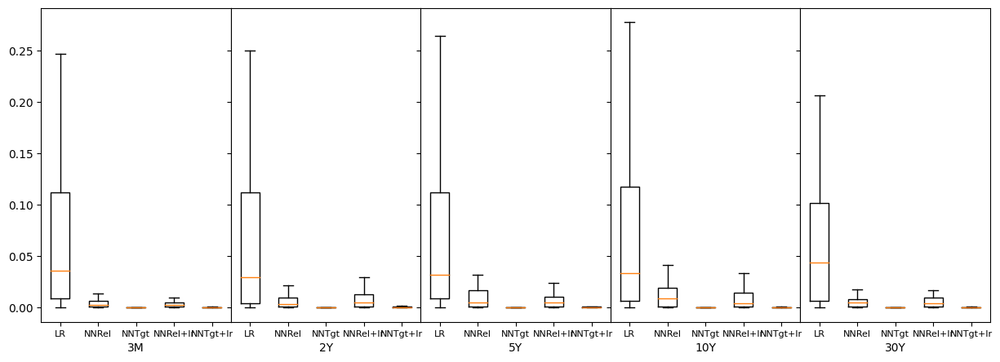

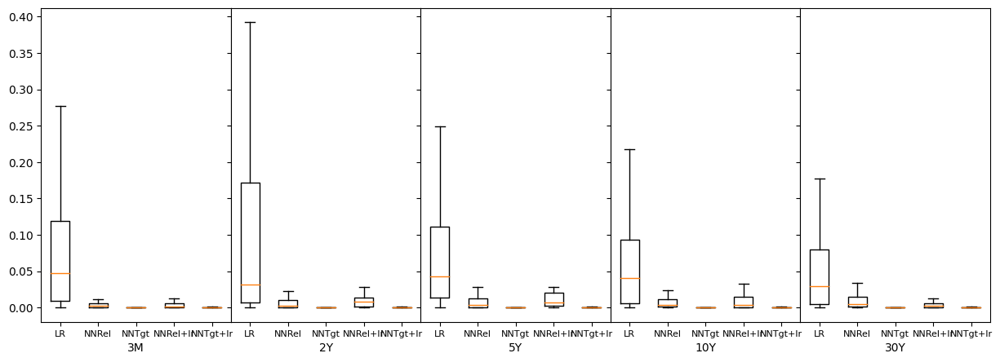

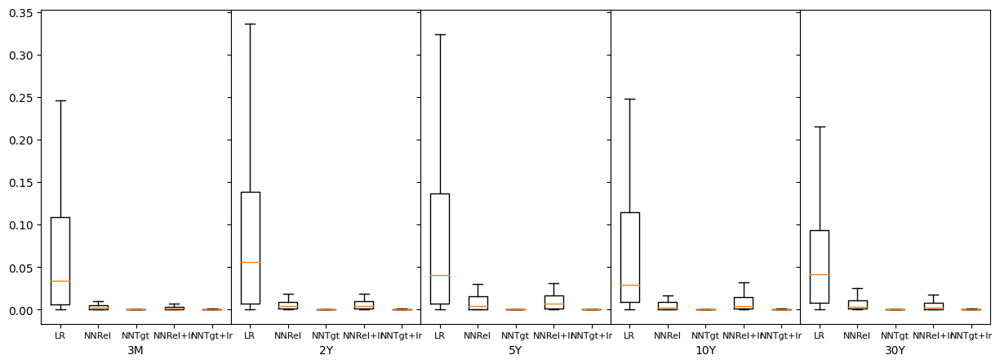

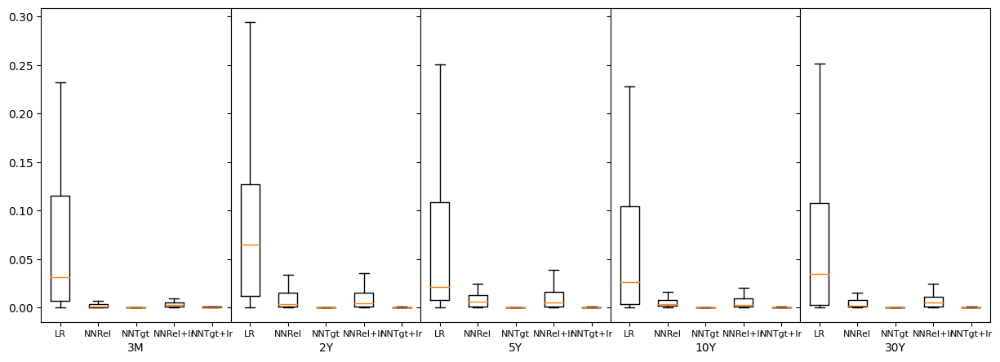

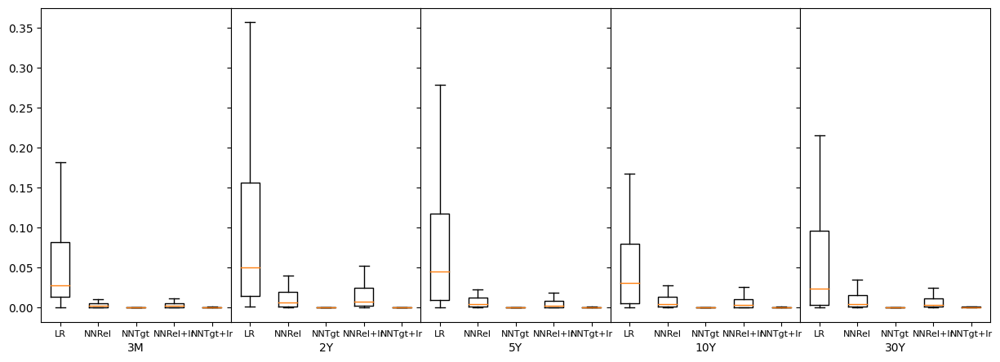

In [14]:
for i in range(len(horizons)):
    plot_function1(i)

In [15]:
table4_non_normalized = NN_RelFeat_non_normalized('GECU10YR_lag_1')

Epoch 1/800
33/33 [==============================] - 2s 10ms/step - loss: 3763775.5000 - mae: 1532.8438 - mse: 3763775.5000 - root_mean_squared_error: 1940.0453 - val_loss: 523892.0938 - val_mae: 570.7165 - val_mse: 523892.0938 - val_root_mean_squared_error: 723.8039
Epoch 2/800
33/33 [==============================] - 0s 4ms/step - loss: 518453.2188 - mae: 599.2031 - mse: 518453.2188 - root_mean_squared_error: 720.0369 - val_loss: 399980.7500 - val_mae: 540.6541 - val_mse: 399980.7500 - val_root_mean_squared_error: 632.4403
Epoch 3/800
33/33 [==============================] - 0s 4ms/step - loss: 383891.7500 - mae: 535.3351 - mse: 383891.7500 - root_mean_squared_error: 619.5900 - val_loss: 323048.0312 - val_mae: 483.9163 - val_mse: 323048.0312 - val_root_mean_squared_error: 568.3731
Epoch 4/800
33/33 [==============================] - 0s 4ms/step - loss: 328631.5625 - mae: 491.9270 - mse: 328631.5625 - root_mean_squared_error: 573.2639 - val_loss: 279995.6875 - val_mae: 449.4083 - val_

In [16]:
normalised_metrics=fig_5['GECU10YR_lag_1']#NN_RelFeat('GECU10Y_lag_1')
non_normalised_metrics=table4_non_normalized
table_4_dict={'Error':['MAE','MSE','RMSE'],
              'Normalised Mean':[normalised_metrics['mae'],
                                 normalised_metrics['mse'],
                                 normalised_metrics['rmse_values']],
              'Normalised Std Dev': [normalised_metrics['std_dev_mae'],
                                    normalised_metrics['std_dev_mse'],
                                    normalised_metrics['std_rmse']],
              
              'Non-Normalised Mean':[non_normalised_metrics['mae'],
                                 non_normalised_metrics['mse'],
                                 non_normalised_metrics['rmse_values']],
              'Non-Normalised Std Dev': [non_normalised_metrics['std_dev_mae'],
                                    non_normalised_metrics['std_dev_mse'],
                                    non_normalised_metrics['std_rmse']]
             }

In [17]:
#convert table 4 dict into dataframe
df_table4=pd.DataFrame.from_dict(table_4_dict)

In [18]:
df_table4

,Error,Normalised Mean,Normalised Std Dev,Non-Normalised Mean,Non-Normalised Std Dev
0,MAE,0.094185,0.071763,0.456365,0.310874
1,MSE,0.014021,0.019560,0.304911,0.315342
2,RMSE,0.118409,0.071763,0.552188,0.310874


In [19]:
d = {'Actual 10Y Yield': fig_5['Actual_Yield'], 'Predicted 10Y Yield': fig_5['Predicted_Yield']}

In [20]:
df = pd.DataFrame(data=d)

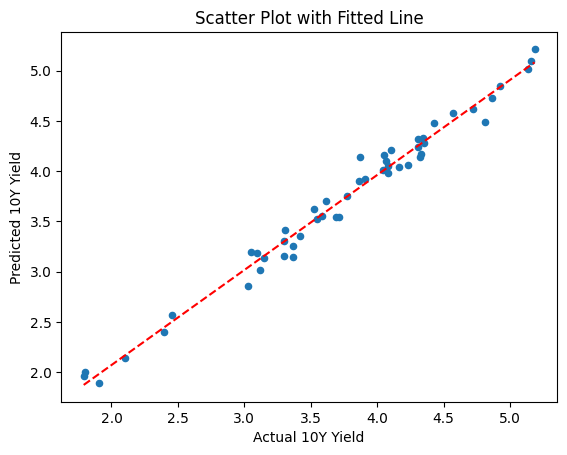

In [21]:
# Plotting the data

df = df.sort_values(by='Actual 10Y Yield')
df.plot(x='Actual 10Y Yield', y='Predicted 10Y Yield', kind='scatter', title='Scatter Plot with Fitted Line')

# Fit a line through the data using numpy.polyfit
fit = np.polyfit(df['Actual 10Y Yield'], df['Predicted 10Y Yield'], 1)

# Add the fitted line to the plot
plt.plot(df['Actual 10Y Yield'], np.polyval(fit, df['Actual 10Y Yield']), 'r--')


# Show the plot
plt.show()

In [22]:
def mlt_RelFeat(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    
    #feature_of_Interest=[list of interested features]'GECU2YR_lag_1'
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    
    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]
    
    target_columns=feature_of_Interest

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    
    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    
    
    #X_train, X_test, y_train, y_test = train_test_split(selected_columns[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are your feature sets
    #scaler = StandardScaler()
    #scaler.fit(X_train)
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]
    # Normalize train and test sets
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(len(feature_of_Interest), activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    return a


In [23]:

horizons_mlt=[1,21]
list_mse_mlt=[]
for i in horizons_mlt:
    by_maturity_mlt=[]
    for j in yields:
        #print(j+str(i))
        target_=j+str(i)
        #print(target_)
        q=mlt_RelFeat([target_])
        by_maturity_mlt.append([q])
    list_mse_mlt.append(by_maturity_mlt)

Epoch 1/500


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.913e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 2s 11ms/step - loss: 7.3024 - mae: 2.3798 - mse: 7.3024 - root_mean_squared_error: 2.7023 - val_loss: 4.0921 - val_mae: 1.7952 - val_mse: 4.0921 - val_root_mean_squared_error: 2.0229
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.7329 - mae: 1.6472 - mse: 3.7329 - root_mean_squared_error: 1.9321 - val_loss: 1.7371 - val_mae: 1.1169 - val_mse: 1.7371 - val_root_mean_squared_error: 1.3180
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.3576 - mae: 0.9071 - mse: 1.3576 - root_mean_squared_error: 1.1652 - val_loss: 0.5027 - val_mae: 0.4862 - val_mse: 0.5027 - val_root_mean_squared_error: 0.7090
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6723 - mae: 0.5611 - mse: 0.6723 - root_mean_squared_error: 0.8200 - val_loss: 0.2997 - val_mae: 0.3253 - val_mse: 0.2997 - val_root_mean_squared_error: 0.5475
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.594e-01, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.8607 - mae: 2.3382 - mse: 6.8607 - root_mean_squared_error: 2.6193 - val_loss: 4.1781 - val_mae: 1.7877 - val_mse: 4.1781 - val_root_mean_squared_error: 2.0440
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.0735 - mae: 1.4757 - mse: 3.0735 - root_mean_squared_error: 1.7531 - val_loss: 1.2251 - val_mae: 0.8574 - val_mse: 1.2251 - val_root_mean_squared_error: 1.1069
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9080 - mae: 0.7104 - mse: 0.9080 - root_mean_squared_error: 0.9529 - val_loss: 0.4960 - val_mae: 0.5450 - val_mse: 0.4960 - val_root_mean_squared_error: 0.7043
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5283 - mae: 0.5501 - mse: 0.5283 - root_mean_squared_error: 0.7269 - val_loss: 0.4477 - val_mae: 0.5362 - val_mse: 0.4477 - val_root_mean_squared_error: 0.6691
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.038e-01, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 14.4041 - mae: 3.6612 - mse: 14.4041 - root_mean_squared_error: 3.7953 - val_loss: 11.9881 - val_mae: 3.3184 - val_mse: 11.9881 - val_root_mean_squared_error: 3.4624
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 8.5075 - mae: 2.6649 - mse: 8.5075 - root_mean_squared_error: 2.9168 - val_loss: 6.6865 - val_mae: 2.3948 - val_mse: 6.6865 - val_root_mean_squared_error: 2.5858
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.7889 - mae: 1.8881 - mse: 4.7889 - root_mean_squared_error: 2.1883 - val_loss: 3.7669 - val_mae: 1.7599 - val_mse: 3.7669 - val_root_mean_squared_error: 1.9409
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2330 - mae: 1.5453 - mse: 3.2330 - root_mean_squared_error: 1.7980 - val_loss: 2.4160 - val_mae: 1.3884 - val_mse: 2.4160 - val_root_mean_squared_error: 1.5544
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - l

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.288e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 4.1664 - mae: 1.7043 - mse: 4.1664 - root_mean_squared_error: 2.0412 - val_loss: 2.2473 - val_mae: 1.2317 - val_mse: 2.2473 - val_root_mean_squared_error: 1.4991
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.9756 - mae: 1.0659 - mse: 1.9756 - root_mean_squared_error: 1.4056 - val_loss: 1.2308 - val_mae: 0.8820 - val_mse: 1.2308 - val_root_mean_squared_error: 1.1094
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2674 - mae: 0.8520 - mse: 1.2674 - root_mean_squared_error: 1.1258 - val_loss: 0.7989 - val_mae: 0.6786 - val_mse: 0.7989 - val_root_mean_squared_error: 0.8938
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9692 - mae: 0.7215 - mse: 0.9692 - root_mean_squared_error: 0.9845 - val_loss: 0.5910 - val_mae: 0.5452 - val_mse: 0.5910 - val_root_mean_squared_error: 0.7688
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.747e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 4.1768 - mae: 1.8495 - mse: 4.1768 - root_mean_squared_error: 2.0437 - val_loss: 3.2654 - val_mae: 1.6117 - val_mse: 3.2654 - val_root_mean_squared_error: 1.8070
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.1430 - mae: 1.1915 - mse: 2.1430 - root_mean_squared_error: 1.4639 - val_loss: 1.5608 - val_mae: 1.0745 - val_mse: 1.5608 - val_root_mean_squared_error: 1.2493
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2568 - mae: 0.8662 - mse: 1.2568 - root_mean_squared_error: 1.1211 - val_loss: 0.7944 - val_mae: 0.7082 - val_mse: 0.7944 - val_root_mean_squared_error: 0.8913
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9104 - mae: 0.6867 - mse: 0.9104 - root_mean_squared_error: 0.9541 - val_loss: 0.5247 - val_mae: 0.4979 - val_mse: 0.5247 - val_root_mean_squared_error: 0.7244
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.485e-01, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.9113 - mae: 2.4765 - mse: 6.9113 - root_mean_squared_error: 2.6289 - val_loss: 5.4269 - val_mae: 2.1540 - val_mse: 5.4269 - val_root_mean_squared_error: 2.3296
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.5986 - mae: 1.6747 - mse: 3.5986 - root_mean_squared_error: 1.8970 - val_loss: 2.8668 - val_mae: 1.5526 - val_mse: 2.8668 - val_root_mean_squared_error: 1.6932
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0203 - mae: 1.2204 - mse: 2.0203 - root_mean_squared_error: 1.4214 - val_loss: 1.5711 - val_mae: 1.1271 - val_mse: 1.5711 - val_root_mean_squared_error: 1.2535
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.4248 - mae: 1.0097 - mse: 1.4248 - root_mean_squared_error: 1.1936 - val_loss: 1.0335 - val_mae: 0.8852 - val_mse: 1.0335 - val_root_mean_squared_error: 1.0166
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.198e-01, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 12.0921 - mae: 3.3588 - mse: 12.0921 - root_mean_squared_error: 3.4774 - val_loss: 9.1784 - val_mae: 2.8911 - val_mse: 9.1784 - val_root_mean_squared_error: 3.0296
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 6.4954 - mae: 2.3303 - mse: 6.4954 - root_mean_squared_error: 2.5486 - val_loss: 3.7813 - val_mae: 1.6437 - val_mse: 3.7813 - val_root_mean_squared_error: 1.9446
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.8140 - mae: 1.3926 - mse: 2.8140 - root_mean_squared_error: 1.6775 - val_loss: 1.9591 - val_mae: 1.2047 - val_mse: 1.9591 - val_root_mean_squared_error: 1.3997
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.7800 - mae: 1.1074 - mse: 1.7800 - root_mean_squared_error: 1.3342 - val_loss: 1.5442 - val_mae: 1.1082 - val_mse: 1.5442 - val_root_mean_squared_error: 1.2427
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - los

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.204e-01, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 14.4162 - mae: 3.6406 - mse: 14.4162 - root_mean_squared_error: 3.7969 - val_loss: 13.0257 - val_mae: 3.4635 - val_mse: 13.0257 - val_root_mean_squared_error: 3.6091
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 9.5442 - mae: 2.8270 - mse: 9.5442 - root_mean_squared_error: 3.0894 - val_loss: 8.3788 - val_mae: 2.7075 - val_mse: 8.3788 - val_root_mean_squared_error: 2.8946
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 5.9629 - mae: 2.1656 - mse: 5.9629 - root_mean_squared_error: 2.4419 - val_loss: 4.7775 - val_mae: 2.0124 - val_mse: 4.7775 - val_root_mean_squared_error: 2.1858
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.6248 - mae: 1.5933 - mse: 3.6248 - root_mean_squared_error: 1.9039 - val_loss: 2.4330 - val_mae: 1.3601 - val_mse: 2.4330 - val_root_mean_squared_error: 1.5598
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - l

In [24]:

axis=['3M','2Y','5Y','10Y','30Y']
def plot_stl_mtl(i):
    
    '''
    
    Function generates the graphs
    
    Input: number of horizons 
    
    returns the plot data as a nested list
    
    '''
    
    data = []

    for j in range(0, 5):
        list1 = []
        key = axis[j]
        if isinstance(list_mse[i][j][1], pd.DataFrame):
            list1.append(list_mse[i][j][1].values.flatten())
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        elif isinstance(list_mse[i][j][1], np.ndarray):
            list1.append(list_mse[i][j][1].flatten())
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        else:
            list1.append(list_mse[i][j][1])
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        data.append([key, list1])
    attemptlist = ['STL','MTL'] 
    fig, axes = plt.subplots(ncols= len(data), sharey=True,figsize=(15, 5))
    fig.subplots_adjust(wspace=0)
    for ax,d in zip(axes,data):     
        ax.boxplot([d[1][attemptlist.index(attempt)] for attempt in attemptlist],showfliers=False)
        ax.set(xticklabels=attemptlist, xlabel=d[0])
        ax.set_xticklabels(attemptlist, fontsize=8)
    plt.show()

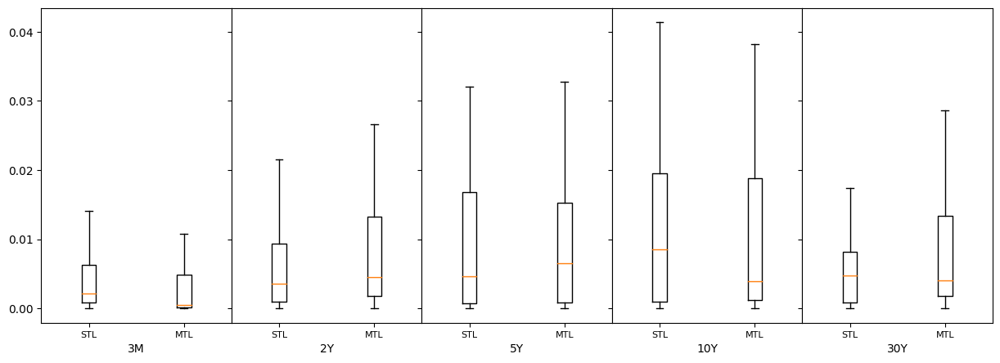

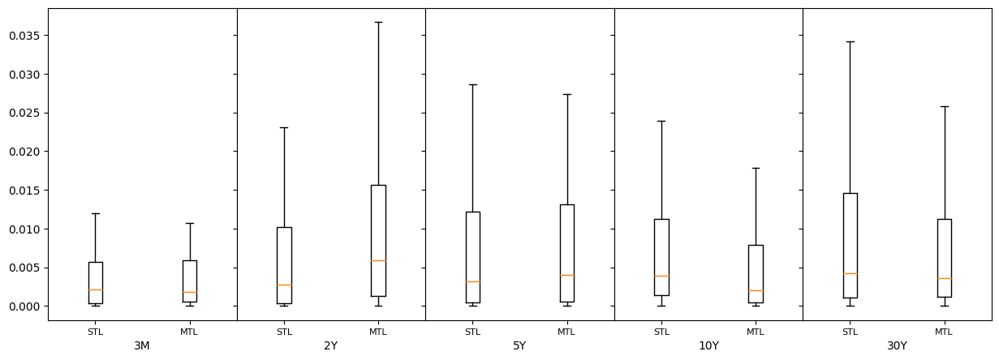

In [25]:
for i in range(len(horizons_mlt)):
    plot_stl_mtl(i)
    